# STRANGER CLUSTERINGS: An exploration of a UFO Sightings dataset

CSCI E-29: Python for Data Science

Graduate Project by Emily Shoemaker

In [1]:
#First, taking care of imports.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)


In [2]:
#Next, I load the raw dataset and take a look.

ufos = pd.read_csv("ufo-sightings.csv",encoding='latin-1', low_memory=False)

ufos.head()

,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 1949-50. It occurred after a Boy Scout meeting in the Baptist Church. The Baptist Church sit,4/27/2004,29.8830556,-97.9411111
0,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
1,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
2,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
3,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
4,10/10/1961 19:00,bristol,tn,us,sphere,300,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595,-82.188889


In [3]:
#Clearly have to add headers to my columns. Two of the columns contain dates, which is confusing. Also, one of the columns
#contains numbers with no explanation. Went back to the data source to verify what these should be.

ufos.columns = ["DateTime", "City", "State", "Country", "Type", "SecondsDuration", "Duration", "Description", 
                "DatePosted", "Latitude","Longitude"]

ufos.head()

,DateTime,City,State,Country,Type,SecondsDuration,Duration,Description,DatePosted,Latitude,Longitude
0,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
1,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
2,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
3,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
4,10/10/1961 19:00,bristol,tn,us,sphere,300,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595,-82.188889


In [4]:
#Much better. Now to start preparing the data for processing.

#First, I will drop the 'Date Posted' column because I do not care about that.

ufos = ufos.drop(['DatePosted'], axis=1)

ufos.head()

,DateTime,City,State,Country,Type,SecondsDuration,Duration,Description,Latitude,Longitude
0,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,29.38421,-98.581082
1,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,53.2,-2.916667
2,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,28.9783333,-96.645833
3,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,21.4180556,-157.803611
4,10/10/1961 19:00,bristol,tn,us,sphere,300,5 minutes,My father is now 89 my brother 52 the girl wit...,36.595,-82.188889


In [5]:
#Next, let's consider 'Seconds Duration' and 'Duration'. Just from this glance at 'Duration', it is clear that this data
#is in all kinds of formats and cleaning it would be a nightmare. However, it is also clear that 'Seconds Duration' doesn't
#always look accurate. In row 0, the second duration is '7200', which would be the full 2 hours. In row 2, '20' seconds clearly
#doesn't match the '1/2 hour' description. I am going to drop the 'Duration' column for now.

ufos = ufos[pd.to_numeric(ufos['SecondsDuration'], errors='coerce').notnull()]

ufos['SecondsDuration'] = ufos['SecondsDuration'].astype(float).apply(lambda x: int(round(x)))

ufos = ufos.drop(['Duration'],axis=1)

ufos.head()

,DateTime,City,State,Country,Type,SecondsDuration,Description,Latitude,Longitude
0,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1949 Lackland AFB&#44 TX. Lights racing acros...,29.38421,-98.581082
1,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,Green/Orange circular disc over Chester&#44 En...,53.2,-2.916667
2,10/10/1956 21:00,edna,tx,us,circle,20,My older brother and twin sister were leaving ...,28.9783333,-96.645833
3,10/10/1960 20:00,kaneohe,hi,us,light,900,AS a Marine 1st Lt. flying an FJ4B fighter/att...,21.4180556,-157.803611
4,10/10/1961 19:00,bristol,tn,us,sphere,300,My father is now 89 my brother 52 the girl wit...,36.595,-82.188889


In [6]:
#Next I want to look at DateTime. I want to make sure that I have a timestamp object that I can split into 
#components for analysis.

#I also know that there are one or more bad data entries. Glancing through my data, I can see several rows that have 
#numbers instead of datetimes. Let's drop those rows and get timestamps.

ufos = ufos[ufos['DateTime'].str.contains("/") == True]

ufos['DateTime'] = ufos['DateTime'].apply(lambda x: pd.to_datetime(x))

print(type(ufos['DateTime'][0]))
ufos.head()

<class 'pandas._libs.tslib.Timestamp'>


,DateTime,City,State,Country,Type,SecondsDuration,Description,Latitude,Longitude
0,1949-10-10 21:00:00,lackland afb,tx,NaN,light,7200,1949 Lackland AFB&#44 TX. Lights racing acros...,29.38421,-98.581082
1,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20,Green/Orange circular disc over Chester&#44 En...,53.2,-2.916667
2,1956-10-10 21:00:00,edna,tx,us,circle,20,My older brother and twin sister were leaving ...,28.9783333,-96.645833
3,1960-10-10 20:00:00,kaneohe,hi,us,light,900,AS a Marine 1st Lt. flying an FJ4B fighter/att...,21.4180556,-157.803611
4,1961-10-10 19:00:00,bristol,tn,us,sphere,300,My father is now 89 my brother 52 the girl wit...,36.595,-82.188889


In [7]:
#Get rid of any null values.

ufos = ufos.dropna()

ufos.shape


(66039, 9)

In [8]:
#Let's look at Type.

ufos['Type'].unique()

array(['circle', 'light', 'sphere', 'disk', 'fireball', 'unknown', 'oval',
       'other', 'rectangle', 'chevron', 'formation', 'triangle', 'cigar',
       'cylinder', 'delta', 'changing', 'egg', 'diamond', 'flash',
       'teardrop', 'cone', 'cross', 'pyramid', 'round', 'flare', 'hexagon',
       'crescent', 'changed'], dtype=object)

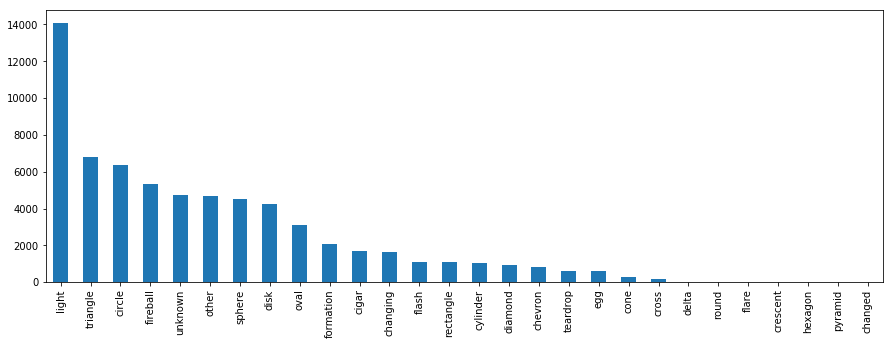

In [9]:
#Lots of different types, some of which I'm not sure what they are. How many of each?

%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 5]
SightingsTypes = ufos['Type'].value_counts()
SightingsTypes.plot(kind='bar')

#Mostly "light" which is not surprising.

In [10]:
ufos['Country'].describe()

#Looks like there are 4 countries here.

count     66039
unique        4
top          us
freq      63098
Name: Country, dtype: object

In [11]:
ufos['Country'].unique()

#Those countries are the US, Canada, Australia, and the UK.

array(['us', 'ca', 'au', 'gb'], dtype=object)

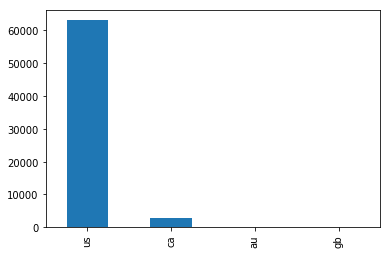

In [12]:
#How many UFO sightings have there been in each country? Let's plot it to see.

%matplotlib inline
SightingsPerCountry = ufos['Country'].value_counts()
SightingsPerCountry.plot(kind='bar')

In [13]:
#Looks like most of this dataset focuses on the USA, so let's dig into that data specifically.
#First capitalize all the states.

ufos['State'] = ufos['State'].apply(lambda x: x.upper())

ufosUSA = pd.DataFrame(ufos.loc[ufos['Country'] == 'us'])

ufosUSA.head()

,DateTime,City,State,Country,Type,SecondsDuration,Description,Latitude,Longitude
2,1956-10-10 21:00:00,edna,TX,us,circle,20,My older brother and twin sister were leaving ...,28.9783333,-96.645833
3,1960-10-10 20:00:00,kaneohe,HI,us,light,900,AS a Marine 1st Lt. flying an FJ4B fighter/att...,21.4180556,-157.803611
4,1961-10-10 19:00:00,bristol,TN,us,sphere,300,My father is now 89 my brother 52 the girl wit...,36.595,-82.188889
6,1965-10-10 23:45:00,norwalk,CT,us,disk,1200,A bright orange color changing to reddish colo...,41.1175,-73.408333
7,1966-10-10 20:00:00,pell city,AL,us,disk,180,Strobe Lighted disk shape object observed clos...,33.5861111,-86.286111


In [14]:
#Great! Now let's map it. Mapping the whole dataset is a sea of green from the East Coast
#to the Mississippi (looks similar to a US Population heatmap) - mapping only a sample subset here.

ufosUSAsample = ufosUSA.sample(n=2000)

data = [dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lon = ufosUSAsample['Longitude'],
        lat = ufosUSAsample['Latitude'],
        mode = 'markers',
        marker = dict(
            size = 5.5,
            opacity = 0.75,
            color = 'rgb(0, 163, 81)',
            line = dict(color = 'rgb(255, 255, 255)', width = 1))
        )]

layout = dict(
        title = 'UFO Sightings',
        showlegend = False,
        geo = dict(
            scope='usa',
            projection=dict(type='albers usa'),
            showland = True,
            landcolor = 'rgb(217, 217, 217)',
            subunitwidth=1,
            countrywidth=1,
            subunitcolor="rgb(255, 255, 255)",
            countrycolor="rgb(255, 255, 255)"
        ),
    )

fig = dict(data=data, layout=layout )
plotly.offline.iplot(fig)

In [15]:
#Interesting. I thought I would see a huge cluster around Area 51, but there are only a few there.
#Let's take a look at a chloropleth map to see what US states registered the highest number
#of UFO sightings.

ufosUSA['StateSightings'] = ufosUSA['State'].groupby(ufosUSA['State']).transform('count')

ufosUSA.head()

#Got help here: 
#https://stackoverflow.com/questions/30244952/python-pandas-create-new-column-with-groupby-sum

,DateTime,City,State,Country,Type,SecondsDuration,Description,Latitude,Longitude,StateSightings
2,1956-10-10 21:00:00,edna,TX,us,circle,20,My older brother and twin sister were leaving ...,28.9783333,-96.645833,3366
3,1960-10-10 20:00:00,kaneohe,HI,us,light,900,AS a Marine 1st Lt. flying an FJ4B fighter/att...,21.4180556,-157.803611,253
4,1961-10-10 19:00:00,bristol,TN,us,sphere,300,My father is now 89 my brother 52 the girl wit...,36.595,-82.188889,1089
6,1965-10-10 23:45:00,norwalk,CT,us,disk,1200,A bright orange color changing to reddish colo...,41.1175,-73.408333,857
7,1966-10-10 20:00:00,pell city,AL,us,disk,180,Strobe Lighted disk shape object observed clos...,33.5861111,-86.286111,625


In [16]:
#Again plotting a sample in terms of color, but the hover counts are accurate.

ufosUSAsample = ufosUSA.sample(n=1000)

scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],
            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = ufosUSAsample['State'],
        z = ufosUSAsample['StateSightings'].astype(float),
        locationmode = 'USA-states',
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "# Sightings")
        ) ]

layout = dict(
        title = 'UFO Sightings by State',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
plotly.offline.iplot(fig)

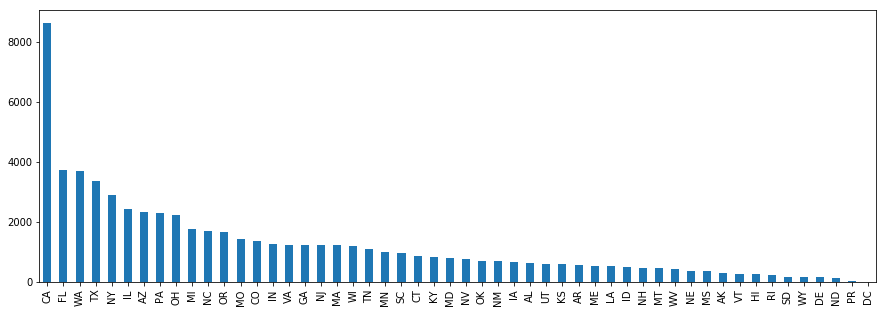

In [17]:
#We can look at a bar graph, too.

%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 5]
SightingsStates = ufosUSA['State'].value_counts()
SightingsStates.plot(kind='bar')

In [18]:
#Mostly in California, which wasn't apparent from the first map. Let's look at the duration map, too.

ufosUSAsample = ufosUSA.sample(n=10000)

ufosUSAsample['Minutes'] = ufosUSAsample['SecondsDuration']/60

#Getting rid of huge outliers, more than 5 hours
ufosUSAsample = ufosUSAsample.loc[ufosUSAsample['Minutes'] < 300]


ufosUSAsample['text'] = ufosUSAsample['Minutes']
limits = [(0,2),(3,30),(31,60),(61,180),(181,300)]
colors = ["rgb(0,255,255)","rgb(128,255,0)","rgb(255,255,0)","rgb(255,128,0)","rgb(255,0,0)"]
sightings = []

for i in range(len(limits)):
    lim = limits[i]
    df_sub = ufosUSAsample[lim[0]:lim[1]]
    sighting = dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lon = df_sub['Longitude'],
        lat = df_sub['Latitude'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['Minutes'],
            color = colors[i],
            line = dict(width=0.5, color='rgb(40,40,40)'),
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1]) )
    sightings.append(sighting)

layout = dict(
        title = 'UFO Sighting Durations',
        showlegend = True,
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showland = True,
            landcolor = 'rgb(217, 217, 217)',
            subunitwidth=1,
            countrywidth=1,
            subunitcolor="rgb(255, 255, 255)",
            countrycolor="rgb(255, 255, 255)"
        ),
    )

fig = dict( data=sightings, layout=layout )
plotly.offline.iplot(fig, validate=False)


In [19]:
#Now I want to look at each feature and transform it for ML.

#First I will split up the timestamp object. Later I will make some bins for different chunks.

ufosUSA['year'] = ufosUSA['DateTime'].apply(lambda x: x.year)
ufosUSA['month'] = ufosUSA['DateTime'].apply(lambda x: x.month)
ufosUSA['day'] = ufosUSA['DateTime'].apply(lambda x: x.day)
ufosUSA['hour'] = ufosUSA['DateTime'].apply(lambda x: x.hour)

ufosUSA.head()

,DateTime,City,State,Country,Type,SecondsDuration,Description,Latitude,Longitude,StateSightings,year,month,day,hour
2,1956-10-10 21:00:00,edna,TX,us,circle,20,My older brother and twin sister were leaving ...,28.9783333,-96.645833,3366,1956,10,10,21
3,1960-10-10 20:00:00,kaneohe,HI,us,light,900,AS a Marine 1st Lt. flying an FJ4B fighter/att...,21.4180556,-157.803611,253,1960,10,10,20
4,1961-10-10 19:00:00,bristol,TN,us,sphere,300,My father is now 89 my brother 52 the girl wit...,36.595,-82.188889,1089,1961,10,10,19
6,1965-10-10 23:45:00,norwalk,CT,us,disk,1200,A bright orange color changing to reddish colo...,41.1175,-73.408333,857,1965,10,10,23
7,1966-10-10 20:00:00,pell city,AL,us,disk,180,Strobe Lighted disk shape object observed clos...,33.5861111,-86.286111,625,1966,10,10,20


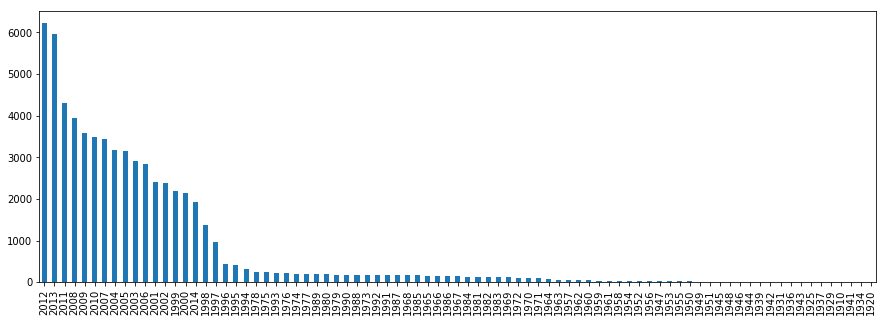

In [20]:
#While I'm at it, I want to see how many UFO sightings have taken place over time.

%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 5]
SightingsYears = ufosUSA['year'].value_counts()
SightingsYears.plot(kind='bar')

#Looks like the bulk of this dataset is from the late 90s to 2000s.

In [21]:
#Let's do KMeans clustering on the 'Description' column and see what we find.

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import stop_words
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans

In [22]:
k = 10

tvec = TfidfVectorizer(stop_words=['english','44'])
tfidf = tvec.fit_transform(ufosUSA['Description'])

model = MiniBatchKMeans(n_clusters=k, max_iter=100)
model.fit(tfidf)

feature_names = tvec.get_feature_names()
cluster_centers = model.cluster_centers_.argsort()[:, ::-1]

In [23]:
def cluster_word_similarity(k):
    """
    Requires `feature_names` and `cluster_centers` global variables.
    For some number of clusters k, determines relevant keywords for that cluster.
    
    @param feature_names: An array of feature names derived from the tf-idf vectorizer.
    @param cluster_centers: Coordinates of cluster centers from k-means clustering procedure
    """
    word_list = [[feature_names[j] for j in cluster_centers[i,:k]] for i in range(0,k)]
    for w in range(len(word_list)):
        print('Cluster ' + str(w), word_list[w], '\n')

In [24]:
cluster_word_similarity(10)

Cluster 0 ['flashing', 'lights', 'red', 'light', 'in', 'and', 'with', 'white', 'sky', 'the'] 

Cluster 1 ['red', 'lights', 'and', 'light', 'white', 'with', 'orange', 'over', 'in', 'blue'] 

Cluster 2 ['sky', 'in', 'the', 'across', 'lights', 'orange', 'light', 'night', 'bright', 'object'] 

Cluster 3 ['it', 'was', 'the', 'and', 'to', 'in', 'saw', 'object', 'of', 'then'] 

Cluster 4 ['objects', 'two', 'in', 'flying', 'lights', 'the', 'over', 'and', 'of', 'orange'] 

Cluster 5 ['the', 'my', 'and', 'on', 'to', 'saw', 'were', 'was', 'of', 'we'] 

Cluster 6 ['over', 'object', 'lights', 'shaped', 'in', 'craft', 'with', 'ufo', 'seen', 'of'] 

Cluster 7 ['light', 'bright', 'moving', 'to', 'of', 'white', 'very', 'and', 'fast', 'orange'] 

Cluster 8 ['sighting', '33', 'ufo', 'of', 'in', 'over', 'the', 'daylight', 'object', 'on'] 

Cluster 9 ['note', 'nuforc', 'pd', 'possible', 'ufo', 'of', 'sighting', 'in', 'star', 'venus'] 



In [25]:
#I can't see any meaningful clusters, even after playing around with different sizes of K, so I am going to drop this column.

ufosUSA = ufosUSA.drop(['Description'], axis=1)

ufosUSA.head()

,DateTime,City,State,Country,Type,SecondsDuration,Latitude,Longitude,StateSightings,year,month,day,hour
2,1956-10-10 21:00:00,edna,TX,us,circle,20,28.9783333,-96.645833,3366,1956,10,10,21
3,1960-10-10 20:00:00,kaneohe,HI,us,light,900,21.4180556,-157.803611,253,1960,10,10,20
4,1961-10-10 19:00:00,bristol,TN,us,sphere,300,36.595,-82.188889,1089,1961,10,10,19
6,1965-10-10 23:45:00,norwalk,CT,us,disk,1200,41.1175,-73.408333,857,1965,10,10,23
7,1966-10-10 20:00:00,pell city,AL,us,disk,180,33.5861111,-86.286111,625,1966,10,10,20


In [26]:
#I have City, State, Country, and Type remaining as text fields. I don't care about city, and country is always US,
#so I'll drop them along with the StateSightings feature.

ufosUSA = ufosUSA.drop(['City','Country','StateSightings'], axis=1)

ufosUSA.head()

,DateTime,State,Type,SecondsDuration,Latitude,Longitude,year,month,day,hour
2,1956-10-10 21:00:00,TX,circle,20,28.9783333,-96.645833,1956,10,10,21
3,1960-10-10 20:00:00,HI,light,900,21.4180556,-157.803611,1960,10,10,20
4,1961-10-10 19:00:00,TN,sphere,300,36.595,-82.188889,1961,10,10,19
6,1965-10-10 23:45:00,CT,disk,1200,41.1175,-73.408333,1965,10,10,23
7,1966-10-10 20:00:00,AL,disk,180,33.5861111,-86.286111,1966,10,10,20


In [27]:
#Next I want to bin the times. I am interested in time of day, decade, season, and short/medium/long duration.

#First let's copy the df and work with the copy going forward.

ufosML = ufosUSA.copy()

#Time of day:
hr_bins = [-1, 5, 11, 16, 21, 23]
bin_names = ['Late Night', 'Morning', 'Afternoon', 'Evening', 'Night']
ufosML['TimeOfDay'] = pd.cut(ufosML['hour'], bins=hr_bins, labels=bin_names)

ufosML = ufosML.drop(['hour','day'], axis=1)

ufosML.head()


,DateTime,State,Type,SecondsDuration,Latitude,Longitude,year,month,TimeOfDay
2,1956-10-10 21:00:00,TX,circle,20,28.9783333,-96.645833,1956,10,Evening
3,1960-10-10 20:00:00,HI,light,900,21.4180556,-157.803611,1960,10,Evening
4,1961-10-10 19:00:00,TN,sphere,300,36.595,-82.188889,1961,10,Evening
6,1965-10-10 23:45:00,CT,disk,1200,41.1175,-73.408333,1965,10,Night
7,1966-10-10 20:00:00,AL,disk,180,33.5861111,-86.286111,1966,10,Evening


In [28]:
#Let's take a look.
x = ufosML['TimeOfDay']
data = [go.Histogram(x=x)]
plotly.offline.iplot(data)

In [29]:
#Moving to decade...

print(ufosML['year'].max())
print(ufosML['year'].min())

2014
1910


In [30]:
#Decade:
year_bins = [1909, 1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 1999, 2009, 2019]
year_bin_names = ['1910s','20s','30s','40s','50s','60s','70s','80s','90s','2000s','2010s']
ufosML['Decade'] = pd.cut(ufosML['year'], bins=year_bins, labels=year_bin_names)

ufosML = ufosML.drop(['year'], axis=1)

ufosML.head()

,DateTime,State,Type,SecondsDuration,Latitude,Longitude,month,TimeOfDay,Decade
2,1956-10-10 21:00:00,TX,circle,20,28.9783333,-96.645833,10,Evening,50s
3,1960-10-10 20:00:00,HI,light,900,21.4180556,-157.803611,10,Evening,60s
4,1961-10-10 19:00:00,TN,sphere,300,36.595,-82.188889,10,Evening,60s
6,1965-10-10 23:45:00,CT,disk,1200,41.1175,-73.408333,10,Night,60s
7,1966-10-10 20:00:00,AL,disk,180,33.5861111,-86.286111,10,Evening,60s


In [31]:
#Let's take a look.
x = ufosML['Decade']
data = [go.Histogram(x=x)]
plotly.offline.iplot(data)

In [32]:
#Season:
season_bins = [-1, 2, 5, 8, 11]
season_bin_names = ['Winter','Spring','Summer','Fall']
ufosML['Season'] = pd.cut(ufosML['month'], bins=season_bins, labels=season_bin_names)

ufosML.loc[ufosML['month'].isin(['12']), 'Season'] = 'Winter'

ufosML = ufosML.drop(['month'], axis=1)

ufosML.head()

,DateTime,State,Type,SecondsDuration,Latitude,Longitude,TimeOfDay,Decade,Season
2,1956-10-10 21:00:00,TX,circle,20,28.9783333,-96.645833,Evening,50s,Fall
3,1960-10-10 20:00:00,HI,light,900,21.4180556,-157.803611,Evening,60s,Fall
4,1961-10-10 19:00:00,TN,sphere,300,36.595,-82.188889,Evening,60s,Fall
6,1965-10-10 23:45:00,CT,disk,1200,41.1175,-73.408333,Night,60s,Fall
7,1966-10-10 20:00:00,AL,disk,180,33.5861111,-86.286111,Evening,60s,Fall


In [33]:
#Let's take a look.
x = ufosML['Season']
data = [go.Histogram(x=x)]
plotly.offline.iplot(data)

In [34]:
#And finally, duration.
print(ufosML['SecondsDuration'].max())
print(ufosML['SecondsDuration'].min())

66276000
0


In [35]:
#So I can see from that number that there is clearly a huge time range. When I looked at the raw data and the original
#messy Duration column, long durations are described as years and months.

#For duration, I want to keep the seconds but I also think it would be fun to bin them. Less than one minute is a fly-by. 
#Up to 30 minutes is extraterrestrial reconnaissance. Longer than 30 minutes clearly involves an abduction.

#Anything longer than 1 month is a bona fide invasion.

duration_bins = [-1, 59, 1799, 2678400, 66276000]
duration_bin_names = ['Fly-By','Recon','Abduction','Invasion']
ufosML['Mission'] = pd.cut(ufosML['SecondsDuration'], bins=duration_bins, labels=duration_bin_names)

ufosML.head()

,DateTime,State,Type,SecondsDuration,Latitude,Longitude,TimeOfDay,Decade,Season,Mission
2,1956-10-10 21:00:00,TX,circle,20,28.9783333,-96.645833,Evening,50s,Fall,Fly-By
3,1960-10-10 20:00:00,HI,light,900,21.4180556,-157.803611,Evening,60s,Fall,Recon
4,1961-10-10 19:00:00,TN,sphere,300,36.595,-82.188889,Evening,60s,Fall,Recon
6,1965-10-10 23:45:00,CT,disk,1200,41.1175,-73.408333,Night,60s,Fall,Recon
7,1966-10-10 20:00:00,AL,disk,180,33.5861111,-86.286111,Evening,60s,Fall,Recon


In [36]:
#Let's take a look.
x = ufosML['Mission']
data = [go.Histogram(x=x)]
plotly.offline.iplot(data)

In [37]:
#Where were the invasions?

Invasions = ufosML.loc[ufosML['Mission'] == 'Invasion']

data = [dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lon = Invasions['Longitude'],
        lat = Invasions['Latitude'],
        mode = 'markers',
        marker = dict(
            size = 5.5,
            opacity = 0.75,
            color = 'rgb(0, 163, 81)',
            line = dict(color = 'rgb(255, 255, 255)', width = 1))
        )]

layout = dict(
        title = 'UFO Sightings',
        showlegend = False,
        geo = dict(
            scope='usa',
            projection=dict(type='albers usa'),
            showland = True,
            landcolor = 'rgb(217, 217, 217)',
            subunitwidth=1,
            countrywidth=1,
            subunitcolor="rgb(255, 255, 255)",
            countrycolor="rgb(255, 255, 255)"
        ),
    )

fig = dict(data=data, layout=layout )
plotly.offline.iplot(fig)

In [38]:
#Neat. The one in Hawaii was clearly documented in the Disney movie 'Lilo and Stitch'.

#Now, let's drop the timestamp object so we can make dummies and normalize. I am also dropping Lat and Lon because I can
#only cover so much in a 7-minute video.

ufosML = ufosML.drop(['DateTime','Latitude','Longitude'], axis=1)

ufosML.head()

,State,Type,SecondsDuration,TimeOfDay,Decade,Season,Mission
2,TX,circle,20,Evening,50s,Fall,Fly-By
3,HI,light,900,Evening,60s,Fall,Recon
4,TN,sphere,300,Evening,60s,Fall,Recon
6,CT,disk,1200,Night,60s,Fall,Recon
7,AL,disk,180,Evening,60s,Fall,Recon


In [39]:
#I need dummies for State, Type, TimeOfDay, Season, and Mission. 
#I will normalize SecondsDuration and Decade to fall between 0 and 1.

dummy_state = pd.get_dummies(ufosML['State'],drop_first=True)
dummy_type = pd.get_dummies(ufosML['Type'],drop_first=True)
dummy_timeofday = pd.get_dummies(ufosML['TimeOfDay'],drop_first=True)
dummy_season = pd.get_dummies(ufosML['Season'],drop_first=True)
dummy_mission = pd.get_dummies(ufosML['Mission'],drop_first=True)

dummies = pd.concat([ufosML.drop(['State','Type','TimeOfDay','Season','Mission'],axis=1), 
                     dummy_state, dummy_type, dummy_timeofday, dummy_season, dummy_mission], axis=1)

dummies.shape

(63098, 90)

In [40]:
#89 columns, will need to reduce. But first, normalizing the other features. The 11 Decade bins I will do manually,
#0 being old and 1 being recent.

ufosML['Decade'] = ufosML['Decade'].map({'1910s': 0, '20s': .1, '30s': .2, '40s': .3, '50s': .4, '60s': .5, 
                                         '70s': .6, '80s': .7, '90s': .8, '2000s': .9, '2010s': 1})

ufosML.head()

,State,Type,SecondsDuration,TimeOfDay,Decade,Season,Mission
2,TX,circle,20,Evening,0.4,Fall,Fly-By
3,HI,light,900,Evening,0.5,Fall,Recon
4,TN,sphere,300,Evening,0.5,Fall,Recon
6,CT,disk,1200,Night,0.5,Fall,Recon
7,AL,disk,180,Evening,0.5,Fall,Recon


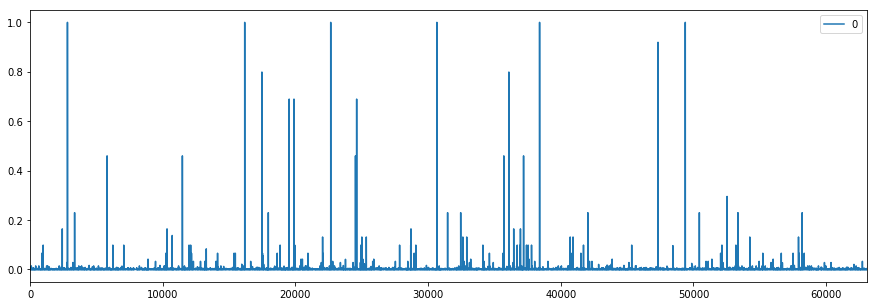

In [41]:
#For SecondsDuration, I know there is a huge range so I might not get great results from normalizing.
#I will try dropping the Invasions and see if that helps.

ufosML_noinv = ufosML[ufosML['Mission'] != 'Invasion']

from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

x = ufosML_noinv[['SecondsDuration']].values.astype(float)
x_scaled = mms.fit_transform(x)
df_normalized = pd.DataFrame(x_scaled)
df_normalized.plot()

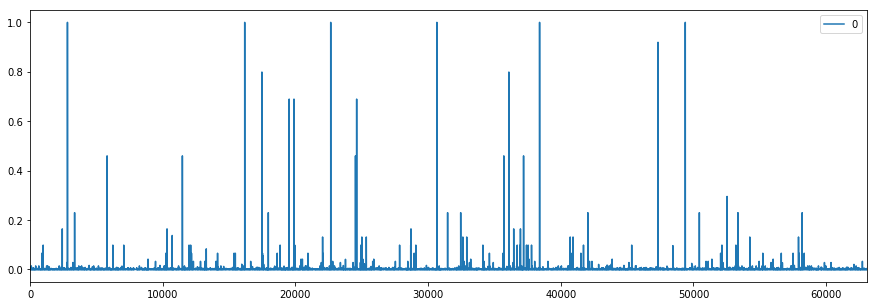

In [42]:
#Not great. I'm going to try the Quantile Transformer instead, which is supposed to be better with outliers.

ufosML_noinv = ufosML[ufosML['Mission'] != 'Invasion']

from sklearn.preprocessing import QuantileTransformer
qt = MinMaxScaler()

x = ufosML_noinv[['SecondsDuration']].values.astype(float)
x_scaled = qt.fit_transform(x)
df_normalized = pd.DataFrame(x_scaled)
df_normalized.plot()

In [43]:
#That looks pretty similar. Well, let's transform the duration bins instead, somewhat arbitrarily

ufosML['Mission'] = ufosML['Mission'].map({'Fly-By': 0, 'Recon': .1, 'Abduction': .3, 'Invasion': 1})

ufosML.head()

,State,Type,SecondsDuration,TimeOfDay,Decade,Season,Mission
2,TX,circle,20,Evening,0.4,Fall,0.0
3,HI,light,900,Evening,0.5,Fall,0.1
4,TN,sphere,300,Evening,0.5,Fall,0.1
6,CT,disk,1200,Night,0.5,Fall,0.1
7,AL,disk,180,Evening,0.5,Fall,0.1


In [44]:
#Now I'll drop the seconds, put everything together, and try to cluster it.

ufos_final = pd.concat([ufosML.drop(['State','Type','SecondsDuration','TimeOfDay','Season'],axis=1), 
                        dummies.drop(['SecondsDuration','Decade'],axis=1)], axis=1)

ufos_final.head()

,Decade,Mission,AL,AR,AZ,CA,CO,CT,DC,DE,...,Morning,Afternoon,Evening,Night,Spring,Summer,Fall,Recon,Abduction,Invasion
2,0.4,0.0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
3,0.5,0.1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
4,0.5,0.1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
6,0.5,0.1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,1,1,0,0
7,0.5,0.1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0


In [45]:
#Ok! To end, I will do PCA and then try K-means.

#First, PCA to reduce these 90 columns.
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

principalComponents = pca.fit_transform(ufos_final)
principalDF = pd.DataFrame(data = principalComponents, columns = ['PC1','PC2'])

principalDF.head()

#Helpful tutorial here: https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

,PC1,PC2
0,-0.897604,0.468142
1,-0.903724,-0.276099
2,-0.897991,-0.304277
3,0.174524,0.186814
4,-0.891734,-0.310983


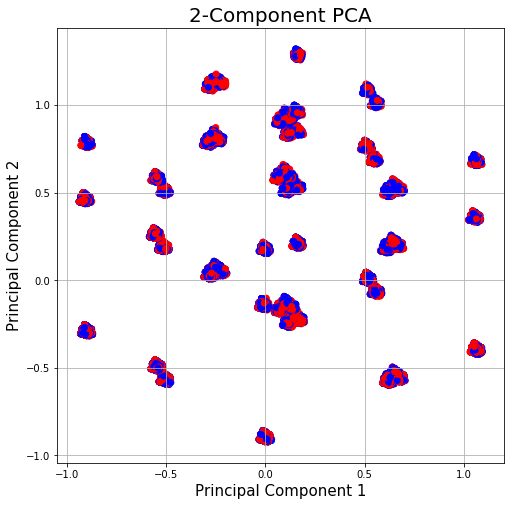

In [46]:
#Plot it:

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2-Component PCA', fontsize = 20)
colors = ['r', 'b']
ax.scatter(principalDF['PC1'], principalDF['PC2'], c = colors)

ax.grid()

In [47]:
pca.explained_variance_ratio_

array([ 0.10570016,  0.08420356])

In [48]:
#Looks like these factors do not do a great job of explaining the variance!

#How many factors does it return if I ask it to explain at least 60% of the variance?

pca = PCA(.60)

principalComponents = pca.fit_transform(ufos_final)
principalDF = pd.DataFrame(data = principalComponents)

principalDF.head()

#90% --> 41 features
#60% --> 12 features
#40% --> 5 features

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.897610,0.468164,0.172781,-0.430836,-0.301173,-0.260753,-0.101659,-0.553921,0.439624,0.480852,-0.406325,-0.208275,-0.014660
1,-0.903724,-0.276097,-0.230440,-0.492311,0.822639,0.099359,-0.114589,0.002519,0.046103,-0.063945,-0.059070,0.007474,0.000767
2,-0.898029,-0.304192,-0.331583,-0.438304,-0.166085,-0.146610,-0.088513,-0.079158,-0.097679,-0.314765,-0.034850,-0.115822,0.054941
3,0.174525,0.186846,-1.030733,-0.523386,-0.006529,-0.372435,0.004438,-0.116042,-0.066172,-0.364564,0.022705,0.036046,0.062953
4,-0.891733,-0.310954,-0.328021,-0.443850,-0.165928,-0.103781,-0.079709,-0.059973,-0.042744,-0.316256,0.016644,0.030608,0.039552


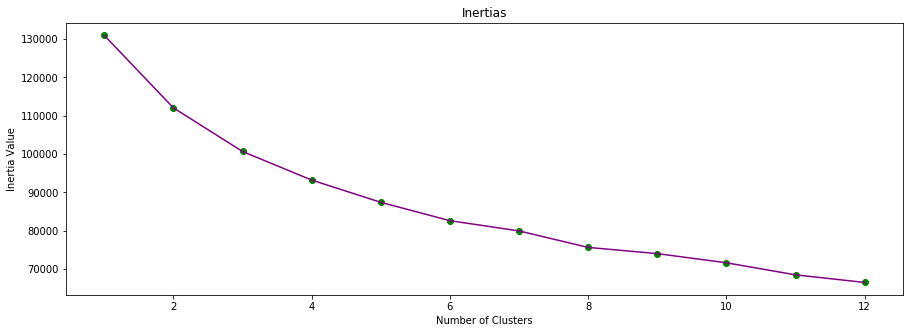

In [49]:
#Looks like PCA was not extremely helpful, but I suppose 41 features is better than 90!

#Can we do Kmeans with the 60% variance PCA?

inertias = []

for i in range(1,13):
    km = KMeans(n_clusters = i, algorithm = "auto")
    km.fit(principalDF)
    inertias.append(round(km.inertia_,2))
inertias

n_clust = range(1,13)

plt.scatter(n_clust,inertias, color = "green")
plt.plot(n_clust, inertias, color = "purple")
plt.title("Inertias")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia Value")
plt.show()

#No clear answer.

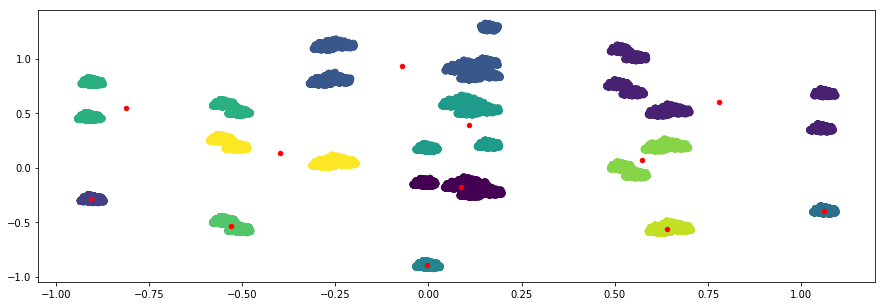

In [50]:
#Going to try it with 2-components and an arbitrary K=12 then, and I don't expect good clusters.

pca = PCA(n_components=2)

principalComponents = pca.fit_transform(ufos_final)
principalDF = pd.DataFrame(data = principalComponents, columns = ['PC1','PC2'])

kmeans = KMeans(n_clusters=12)
kmeans.fit(principalDF)
y_kmeans = kmeans.predict(principalDF)

plt.scatter(principalDF['PC1'], principalDF['PC2'], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=20);

#Tried again with 6 and the clusters didn't look better.
#Nice tips for plotting this found here: https://jakevdp.github.io/PythonDataScienceHandbook/05.11-k-means.html

Since these are pretty strange clusterings, I will end here.

I had a lot of fun playing with this dataset, even though it didn't lend itself well to machine learning exercises for this project. This was my first data science course, so in the future when my skills are better, I would be very interested in comparing the location data with location data on military bases, the number of sightings with the estimated volume of psychdelics consumed per year and/or in various states, etcetera.

Thank you!